<a href="https://colab.research.google.com/github/anders-wiggers/deep-learning-face-detection-/blob/main/FaceCounter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook for facecounter with deep learning

[Segmentation by Pavel Yakubovskiy](https://github.com/qubvel/segmentation_models.pytorch/blob/master/examples/cars%20segmentation%20(camvid).ipynb)

[Dataset- with labesl by Deep Learning and Vision Computing Lab, SCUT](https://github.com/HCIILAB/SCUT-HEAD-Dataset-Release)



# Firstly install depedencies. 

In [ ]:
!pip install -U git+https://github.com/albumentations-team/albumentations

  Cloning https://github.com/albumentations-team/albumentations to /tmp/pip-req-build-71wrtoe7
  Running command git clone -q https://github.com/albumentations-team/albumentations /tmp/pip-req-build-71wrtoe7
     |████████████████████████████████| 952kB 8.7MB/s 
  Created wheel for albumentations: filename=albumentations-0.5.1-cp36-none-any.whl size=72066 sha256=2cb51fb4cea8798bac6cb89ffe32f5c0802c525a9e895391fec698fd59f4067c
  Stored in directory: /tmp/pip-ephem-wheel-cache-uo80_2j8/wheels/6f/77/82/86baf8aeda64a6de0f890cd0f2fb31acaf5545cc9c99ad21ba
Successfully built albumentations
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [ ]:
%%shell

pip install cython
# Install pycocotools, the version by default in Colab
# has a bug fixed in https://github.com/cocodataset/cocoapi/pull/354
pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

git clone https://github.com/pytorch/vision.git
cd vision


cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-7err7r9b
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-7err7r9b
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266458 sha256=d8222c67c35eadce6e4c7131ac56a3ef7d94397542f964b309fab897f1f18c54
  Stored in directory: /tmp/pip-ephem-wheel-cache-1s71k1oy/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0.2
    Uninstalling pycocotools-2.0.2:
      Successfully uninstalled pycocotools-2.0.2
Cloning into 'vision'...
remote: Enumerating objects: 44, done.
remote: Counting objects: 100% (44/44), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 11395 (delta 11), reused 6 (delta 0), pack-reused 11351
Receiving objects: 100% (11395/11395), 12.77 MiB | 20.89 MiB/s, done.
Resolving deltas: 100% (7932/7932), done.


## Download the dataset from DLVCL

In [ ]:
#taken from this StackOverflow answer: https://stackoverflow.com/a/39225039
import requests

def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

download_file_from_google_drive('1LZ_KlTPStDEcqycfqUkDkqQ-aNMMC3cl','object detection v1.zip')
!unzip -q "object detection v1.zip"

## Defining dataset

In [ ]:
datasetSize = 50

In [ ]:
import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import xml.etree.ElementTree as ET


# XML parser
def read_content(xml_file: str):

    tree = ET.parse(xml_file)
    root = tree.getroot()

    list_with_all_boxes = []
    list_with_all_labels = []

    # Loop over bounding boxes in input image
    for boxes in root.iter('object'):

        filename = root.find('filename').text

        ymin, xmin, ymax, xmax = None, None, None, None

        for box in boxes.findall("bndbox"):
            ymin = int(box.find("ymin").text)
            xmin = int(box.find("xmin").text)
            ymax = int(box.find("ymax").text)
            xmax = int(box.find("xmax").text)

        for name in boxes.findall("name"):
            name = name.text

        list_with_single_boxes = [xmin, ymin, xmax, ymax]
        list_with_all_boxes.append(list_with_single_boxes)
        list_with_all_labels.append(name)
    return list_with_all_labels,list_with_all_boxes

class TrainDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms # note that transforms must be a reference to a function
        files = list(sorted(os.listdir(self.root + '/JPEGImages')))
        files = files[:datasetSize] # <-- size of dataset
        self.imgs = []
        for f in files:
          if f.endswith(".jpg"):
            self.imgs.append(f[0:-4])
        
        self.classes = []
        self.classes.append("noperson") # <--- Insert dummy class
        for f in self.imgs:
          xml_path = self.root + '/Annotations/' + f + '.xml'
          names,boxes = read_content(xml_path)
          for name in names:
            if not name in self.classes:
              self.classes.append(name)

    def __getitem__(self, idx):

        # Load image
        img_path = self.root + '/JPEGImages/' + self.imgs[idx]+'.jpg'
        img = Image.open(img_path).convert("RGB")

        # Load bounding box coordinates + class names
        xml_path = self.root + '/Annotations/' + self.imgs[idx]+'.xml'
        names,boxes = read_content(xml_path)
        
        # get bounding box coordinates for each object
        num_objs = len(boxes)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.zeros((num_objs,), dtype=torch.int64)
        for i in range(num_objs):
          for j in range(len(self.classes)):
            if names[i] == self.classes[j]:
              labels[i] = j

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        # Apply data augmentation here by calling transforms function
        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

### TrainDataset with Albumentation

In [ ]:
import cv2
import albumentations as albu


#Give image shape. such we can scale correct. as input
def get_training_augmentation(h=100,w=100):
  train_transform = [
    ## Change this code for transformations
    albu.transforms.Downscale(scale_min=0.1,scale_max=0.1,p=0.5),
    #albu.transforms.Resize(height=h_min,width=w_min,always_apply=True),
    #albu.transforms.Resize(height=h,width=w,always_apply=True)
  ]
  return albu.Compose(train_transform)

#Give image shape. such we can scale correct. as input
def get_scaling_augmentation(h=100,w=100):
  h_scale = int( h * 3)
  w_scale = int(w * 3)
  train_transform = [
    ## Change this code for transformations
    albu.transforms.Resize(height=h_scale,width=w_scale,always_apply=True)
  ]
  return albu.Compose(train_transform)

def get_aug(aug, min_area=0., min_visibility=0.):
  return albu.Compose(aug, bbox_params=albu.BboxParams(format='pascal_voc', min_area=min_area, 
                                              min_visibility=min_visibility, label_fields=['category_id']))

class TrainDatasetArgumented(torch.utils.data.Dataset):
  def __init__(self, root, transforms=None, eval=False):
    self.root = root
    self.transforms = transforms # note that transforms must be a reference to a function
    files = list(sorted(os.listdir(self.root + '/JPEGImages')))
    files = files[:datasetSize] # <-- size of dataset
    self.imgs = []
    self.eval = eval
    for f in files:
      if f.endswith(".jpg"):
        self.imgs.append(f[0:-4])
    
    self.classes = []
    self.classes.append("noperson") # <--- Insert dummy class
    for f in self.imgs:
      xml_path = self.root + '/Annotations/' + f + '.xml'
      names,boxes = read_content(xml_path)
      for name in names:
        if not name in self.classes:
          self.classes.append(name)

  def __getitem__(self, idx):
    # Load image
    img_path = self.root + '/JPEGImages/' + self.imgs[idx]+'.jpg'

    # Load bounding box coordinates + class names
    xml_path = self.root + '/Annotations/' + self.imgs[idx]+'.xml'
    names,boxes = read_content(xml_path)
    
    # get bounding box coordinates for each object
    num_objs = len(boxes)

    category_id = []
    for i in range(num_objs):
      for j in range(len(self.classes)):
        if names[i] == self.classes[j]:
          category_id.append(j)

    cimg = cv2.imread(img_path)
    cimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB)
    h,w,c = cimg.shape
    annotations = {'image': cimg, 'bboxes': boxes, 'category_id': category_id}
    
    if (self.eval == False):
      aug = get_aug(get_training_augmentation(h,w),min_visibility=0.5)
    else:
      aug = get_aug(get_scaling_augmentation(h,w),min_visibility=0.5)
    
    augmented = aug(**annotations)


    boxes = []
    for idx, bbox in enumerate(augmented['bboxes']):
      boxes.append(list(bbox))
    
    label_idx = augmented['category_id']

    img = augmented['image']
    #img = img.transpose(2, 0, 1).astype('float32')
    #img = torch.from_numpy(img)


    num_objs = len(boxes)

    ##old code
    boxes = torch.as_tensor(boxes, dtype=torch.float32)
    

    labels = torch.zeros((num_objs,), dtype=torch.int64)
    for i in range(num_objs):
      labels[i] = label_idx[i]

    image_id = torch.tensor([idx])
    area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
    # suppose all instances are not crowd
    iscrowd = torch.zeros((num_objs,), dtype=torch.int64)


    target = {}
    target["boxes"] = boxes
    target["labels"] = labels
    target["image_id"] = image_id
    target["area"] = area
    target["iscrowd"] = iscrowd

    # Apply data augmentation here by calling transforms function
    if self.transforms is not None:
        img, target = self.transforms(img, target)

    return img, target

  def __len__(self):
    return len(self.imgs)

In [ ]:
def display_img(img,prediction):
  # Undo preprocessing
  img2 = Image.fromarray(img.mul(1).permute(1, 2, 0).byte().numpy())
  plt.figure()
  fig, ax = plt.subplots(1, figsize=(12,9))
  ax.imshow(img2)
  boxes = prediction['boxes'].cpu().numpy()
  labels = prediction['labels'].cpu().numpy()
  for i in range(boxes.shape[0]):
    x1 = boxes[i,0]
    y1 = boxes[i,1]
    box_w = boxes[i,2] - x1
    box_h = boxes[i,3] - y1

    color = colors[int(labels[i])]
    bbox = patches.Rectangle((x1, y1), box_w, box_h,
              linewidth=2, edgecolor=color, facecolor='none')
    ax.add_patch(bbox)
    plt.text(x1, y1, s=classes[labels[i]], 
                  color='white', verticalalignment='top',
                  bbox={'color': color, 'pad': 0})
  plt.axis('off')
  plt.show()

torch.Size([3, 800, 1200])


<Figure size 432x288 with 0 Axes>

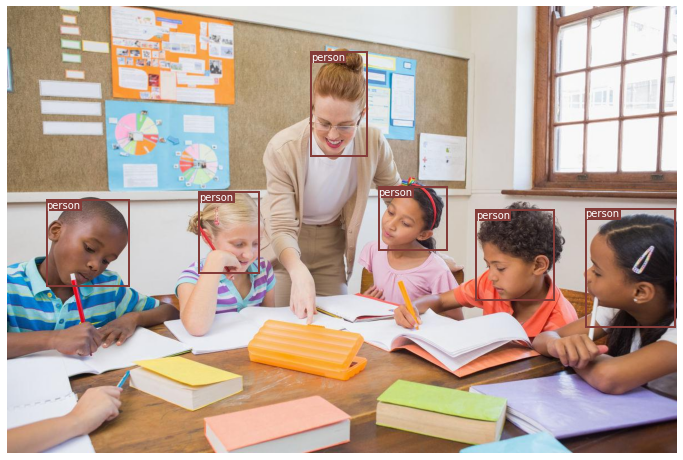

{'area': tensor([ 696.,  784., 1156., 1560.,  360.,  306., 4218.,  500.,  810.,  272.,
          858.,  616., 8096.,  550.,  285.,  336.,  600.,  414.,  300.,  396.,
          320.,  462.,  336., 2550.,  598., 7820.]),
 'boxes': tensor([[ 19., 193.,  43., 222.],
         [ 72., 206., 100., 234.],
         [ 95., 219., 129., 253.],
         [134., 212., 174., 251.],
         [134., 192., 152., 212.],
         [183., 187., 200., 205.],
         [207., 218., 264., 292.],
         [262., 202., 282., 227.],
         [277., 213., 307., 240.],
         [271., 191., 287., 208.],
         [323., 208., 349., 241.],
         [327., 201., 349., 229.],
         [307., 261., 399., 349.],
         [370., 208., 392., 233.],
         [376., 200., 391., 219.],
         [406., 192., 422., 213.],
         [419., 209., 439., 239.],
         [428., 204., 446., 227.],
         [449., 197., 464., 217.],
         [477., 211., 495., 233.],
         [484., 203., 500., 223.],
         [498., 207., 519., 229.],
  

In [ ]:
datasetArg = TrainDatasetArgumented('SCUT_HEAD_Part_B',transforms=T.ToTensor())

# pick random image from the test set
indices = torch.randperm(len(dataset)).tolist()
img, prediction = datasetArg[indices[0]]

print(img.shape)

# Display image
display_img(img,prediction)

# This prints the corresponding metadata
dataset[0][1]

## Displaying data from the training images

PartB_00001


<Figure size 432x288 with 0 Axes>

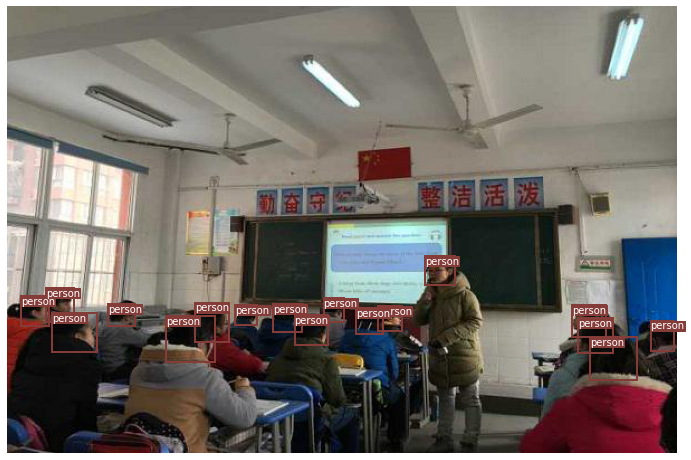

{'area': tensor([ 696.,  784., 1156., 1560.,  360.,  306., 4218.,  500.,  810.,  272.,
          858.,  616., 8096.,  550.,  285.,  336.,  600.,  414.,  300.,  396.,
          320.,  462.,  336., 2550.,  598., 7820.]),
 'boxes': tensor([[ 19., 193.,  43., 222.],
         [ 72., 206., 100., 234.],
         [ 95., 219., 129., 253.],
         [134., 212., 174., 251.],
         [134., 192., 152., 212.],
         [183., 187., 200., 205.],
         [207., 218., 264., 292.],
         [262., 202., 282., 227.],
         [277., 213., 307., 240.],
         [271., 191., 287., 208.],
         [323., 208., 349., 241.],
         [327., 201., 349., 229.],
         [307., 261., 399., 349.],
         [370., 208., 392., 233.],
         [376., 200., 391., 219.],
         [406., 192., 422., 213.],
         [419., 209., 439., 239.],
         [428., 204., 446., 227.],
         [449., 197., 464., 217.],
         [477., 211., 495., 233.],
         [484., 203., 500., 223.],
         [498., 207., 519., 229.],
  

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import transforms as T

# Set up dataset
dataset = TrainDataset('SCUT_HEAD_Part_B',transforms=T.ToTensor())
print(dataset.imgs[1])
# Get list af class names in dataset
classes = dataset.classes

# Set up some plotting conofigurations
cmap = plt.get_cmap('tab20b')
colors = [cmap(i) for i in np.linspace(0, 1, 20)]

def display_img(img,prediction):
  # Undo preprocessing
  img2 = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
  plt.figure()
  fig, ax = plt.subplots(1, figsize=(12,9))
  ax.imshow(img2)
  boxes = prediction['boxes'].cpu().numpy()
  labels = prediction['labels'].cpu().numpy()
  for i in range(boxes.shape[0]):
    x1 = boxes[i,0]
    y1 = boxes[i,1]
    box_w = boxes[i,2] - x1
    box_h = boxes[i,3] - y1

    color = colors[12]
    bbox = patches.Rectangle((x1, y1), box_w, box_h,
              linewidth=2, edgecolor=color, facecolor='none')
    ax.add_patch(bbox)
    plt.text(x1, y1, s=classes[labels[i]], 
                  color='white', verticalalignment='top',
                  bbox={'color': color, 'pad': 0})
  plt.axis('off')
  plt.show()

# pick random image from the test set
indices = torch.randperm(len(dataset)).tolist()
img, prediction = dataset[indices[0]]

# Display image
display_img(img,prediction)

# This prints the corresponding metadata
dataset[0][1]

# Defining the model

In [ ]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
      
def get_object_detect_model(num_classes):
  # load an instance segmentation model pre-trained on COCO
  model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
  print(model)

  # get the number of input features for the classifier
  in_features = model.roi_heads.box_predictor.cls_score.in_features
  

  # replace the pre-trained head with a new one
  model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
  print(model)
  return model

## Creating data loaders

In [ ]:
import utils

train_set, test_set,  val_set = torch.utils.data.random_split(dataset, [datasetSize-5, 5, 0])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    train_set, batch_size=1, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    test_set, batch_size=1, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_val = torch.utils.data.DataLoader(
    val_set, batch_size=1, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

In [ ]:
print(len(train_set))

45


In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

num_classes = 2

model = get_object_detect_model(num_classes)

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.001,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.8)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256)
          (relu): ReLU(inplace=True)
          (downsample)

## Training the Network

Epoch: [0]  [ 0/45]  eta: 0:00:52  lr: 0.000024  loss: 1.8970 (1.8970)  loss_classifier: 0.6795 (0.6795)  loss_box_reg: 0.6980 (0.6980)  loss_objectness: 0.3974 (0.3974)  loss_rpn_box_reg: 0.1221 (0.1221)  time: 1.1650  data: 0.6487  max mem: 4605
Epoch: [0]  [10/45]  eta: 0:00:13  lr: 0.000251  loss: 1.5483 (1.4167)  loss_classifier: 0.5888 (0.5921)  loss_box_reg: 0.5026 (0.4881)  loss_objectness: 0.2650 (0.2635)  loss_rpn_box_reg: 0.0480 (0.0730)  time: 0.3903  data: 0.0639  max mem: 4605
Epoch: [0]  [20/45]  eta: 0:00:08  lr: 0.000478  loss: 1.4042 (1.2976)  loss_classifier: 0.5345 (0.5184)  loss_box_reg: 0.5994 (0.5467)  loss_objectness: 0.1037 (0.1767)  loss_rpn_box_reg: 0.0281 (0.0558)  time: 0.3150  data: 0.0051  max mem: 4605
Epoch: [0]  [30/45]  eta: 0:00:05  lr: 0.000705  loss: 1.2862 (1.2904)  loss_classifier: 0.3799 (0.4733)  loss_box_reg: 0.7431 (0.6218)  loss_objectness: 0.0821 (0.1451)  loss_rpn_box_reg: 0.0259 (0.0503)  time: 0.3193  data: 0.0059  max mem: 4605
Epoch: [

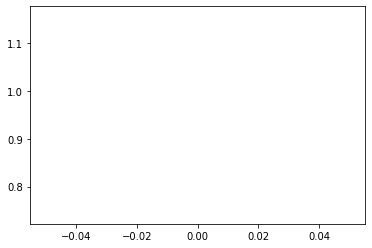

Epoch: [1]  [ 0/45]  eta: 0:00:33  lr: 0.001000  loss: 1.1078 (1.1078)  loss_classifier: 0.2970 (0.2970)  loss_box_reg: 0.6889 (0.6889)  loss_objectness: 0.0938 (0.0938)  loss_rpn_box_reg: 0.0281 (0.0281)  time: 0.7470  data: 0.4145  max mem: 4605
Epoch: [1]  [10/45]  eta: 0:00:12  lr: 0.001000  loss: 0.7705 (0.7718)  loss_classifier: 0.2021 (0.2032)  loss_box_reg: 0.5350 (0.5241)  loss_objectness: 0.0106 (0.0248)  loss_rpn_box_reg: 0.0091 (0.0196)  time: 0.3595  data: 0.0408  max mem: 4605
Epoch: [1]  [20/45]  eta: 0:00:09  lr: 0.001000  loss: 0.6749 (0.7225)  loss_classifier: 0.1527 (0.1915)  loss_box_reg: 0.4536 (0.4823)  loss_objectness: 0.0106 (0.0250)  loss_rpn_box_reg: 0.0156 (0.0237)  time: 0.3477  data: 0.0208  max mem: 4605
Epoch: [1]  [30/45]  eta: 0:00:05  lr: 0.001000  loss: 0.7022 (0.7229)  loss_classifier: 0.2047 (0.1933)  loss_box_reg: 0.4408 (0.4772)  loss_objectness: 0.0182 (0.0223)  loss_rpn_box_reg: 0.0226 (0.0301)  time: 0.3542  data: 0.0235  max mem: 4605
Epoch: [

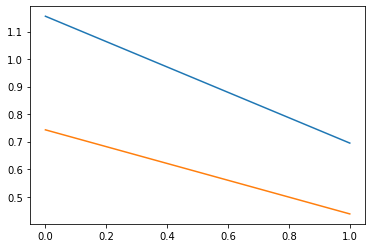

Epoch: [2]  [ 0/45]  eta: 0:00:39  lr: 0.001000  loss: 0.7474 (0.7474)  loss_classifier: 0.2162 (0.2162)  loss_box_reg: 0.4639 (0.4639)  loss_objectness: 0.0269 (0.0269)  loss_rpn_box_reg: 0.0404 (0.0404)  time: 0.8867  data: 0.5009  max mem: 4605
Epoch: [2]  [10/45]  eta: 0:00:13  lr: 0.001000  loss: 0.6492 (0.6151)  loss_classifier: 0.1761 (0.1616)  loss_box_reg: 0.4279 (0.4038)  loss_objectness: 0.0133 (0.0145)  loss_rpn_box_reg: 0.0404 (0.0352)  time: 0.3769  data: 0.0520  max mem: 4605
Epoch: [2]  [20/45]  eta: 0:00:09  lr: 0.001000  loss: 0.5168 (0.5874)  loss_classifier: 0.1460 (0.1569)  loss_box_reg: 0.3549 (0.3882)  loss_objectness: 0.0116 (0.0139)  loss_rpn_box_reg: 0.0258 (0.0283)  time: 0.3398  data: 0.0146  max mem: 4605
Epoch: [2]  [30/45]  eta: 0:00:05  lr: 0.001000  loss: 0.4416 (0.5352)  loss_classifier: 0.1139 (0.1417)  loss_box_reg: 0.3351 (0.3589)  loss_objectness: 0.0033 (0.0109)  loss_rpn_box_reg: 0.0119 (0.0237)  time: 0.3362  data: 0.0155  max mem: 4605
Epoch: [

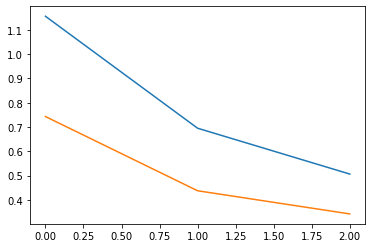

Epoch: [3]  [ 0/45]  eta: 0:00:51  lr: 0.000800  loss: 0.6173 (0.6173)  loss_classifier: 0.1651 (0.1651)  loss_box_reg: 0.3872 (0.3872)  loss_objectness: 0.0031 (0.0031)  loss_rpn_box_reg: 0.0620 (0.0620)  time: 1.1421  data: 0.7217  max mem: 4605
Epoch: [3]  [10/45]  eta: 0:00:14  lr: 0.000800  loss: 0.6173 (0.5596)  loss_classifier: 0.1799 (0.1592)  loss_box_reg: 0.3530 (0.3555)  loss_objectness: 0.0066 (0.0111)  loss_rpn_box_reg: 0.0211 (0.0338)  time: 0.4151  data: 0.0961  max mem: 4605
Epoch: [3]  [20/45]  eta: 0:00:09  lr: 0.000800  loss: 0.5426 (0.5475)  loss_classifier: 0.1697 (0.1507)  loss_box_reg: 0.3524 (0.3594)  loss_objectness: 0.0045 (0.0087)  loss_rpn_box_reg: 0.0178 (0.0286)  time: 0.3308  data: 0.0222  max mem: 4605
Epoch: [3]  [30/45]  eta: 0:00:05  lr: 0.000800  loss: 0.4388 (0.5102)  loss_classifier: 0.1078 (0.1399)  loss_box_reg: 0.3099 (0.3365)  loss_objectness: 0.0035 (0.0084)  loss_rpn_box_reg: 0.0141 (0.0254)  time: 0.3204  data: 0.0087  max mem: 4605
Epoch: [

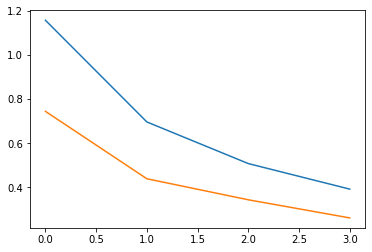

Epoch: [4]  [ 0/45]  eta: 0:01:15  lr: 0.000800  loss: 0.6447 (0.6447)  loss_classifier: 0.2016 (0.2016)  loss_box_reg: 0.3627 (0.3627)  loss_objectness: 0.0211 (0.0211)  loss_rpn_box_reg: 0.0592 (0.0592)  time: 1.6812  data: 1.3264  max mem: 4605
Epoch: [4]  [10/45]  eta: 0:00:15  lr: 0.000800  loss: 0.5163 (0.4619)  loss_classifier: 0.1476 (0.1351)  loss_box_reg: 0.3083 (0.2941)  loss_objectness: 0.0064 (0.0071)  loss_rpn_box_reg: 0.0166 (0.0255)  time: 0.4385  data: 0.1252  max mem: 4605
Epoch: [4]  [20/45]  eta: 0:00:09  lr: 0.000800  loss: 0.4887 (0.4628)  loss_classifier: 0.1386 (0.1341)  loss_box_reg: 0.3083 (0.2952)  loss_objectness: 0.0053 (0.0083)  loss_rpn_box_reg: 0.0172 (0.0251)  time: 0.3182  data: 0.0063  max mem: 4605
Epoch: [4]  [30/45]  eta: 0:00:05  lr: 0.000800  loss: 0.4488 (0.4433)  loss_classifier: 0.1318 (0.1268)  loss_box_reg: 0.3212 (0.2883)  loss_objectness: 0.0031 (0.0068)  loss_rpn_box_reg: 0.0147 (0.0214)  time: 0.3147  data: 0.0059  max mem: 4605
Epoch: [

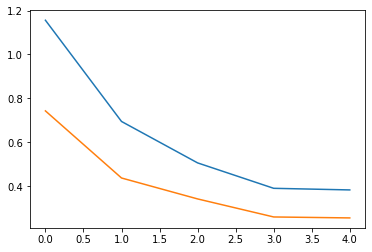

Epoch: [5]  [ 0/45]  eta: 0:00:40  lr: 0.000800  loss: 0.6265 (0.6265)  loss_classifier: 0.2007 (0.2007)  loss_box_reg: 0.3776 (0.3776)  loss_objectness: 0.0025 (0.0025)  loss_rpn_box_reg: 0.0458 (0.0458)  time: 0.8932  data: 0.5586  max mem: 4605
Epoch: [5]  [10/45]  eta: 0:00:12  lr: 0.000800  loss: 0.4131 (0.4538)  loss_classifier: 0.1143 (0.1302)  loss_box_reg: 0.2719 (0.2942)  loss_objectness: 0.0025 (0.0045)  loss_rpn_box_reg: 0.0159 (0.0249)  time: 0.3591  data: 0.0532  max mem: 4605
Epoch: [5]  [20/45]  eta: 0:00:08  lr: 0.000800  loss: 0.3592 (0.4161)  loss_classifier: 0.1060 (0.1197)  loss_box_reg: 0.2409 (0.2726)  loss_objectness: 0.0020 (0.0038)  loss_rpn_box_reg: 0.0108 (0.0200)  time: 0.3185  data: 0.0065  max mem: 4605
Epoch: [5]  [30/45]  eta: 0:00:05  lr: 0.000800  loss: 0.3218 (0.4002)  loss_classifier: 0.0926 (0.1167)  loss_box_reg: 0.2163 (0.2610)  loss_objectness: 0.0008 (0.0039)  loss_rpn_box_reg: 0.0070 (0.0186)  time: 0.3247  data: 0.0085  max mem: 4605
Epoch: [

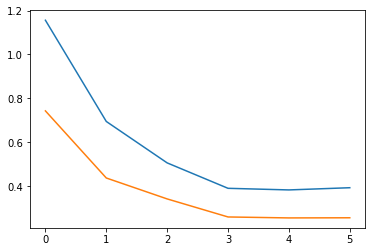

Epoch: [6]  [ 0/45]  eta: 0:00:33  lr: 0.000640  loss: 0.1622 (0.1622)  loss_classifier: 0.0422 (0.0422)  loss_box_reg: 0.1170 (0.1170)  loss_objectness: 0.0003 (0.0003)  loss_rpn_box_reg: 0.0028 (0.0028)  time: 0.7364  data: 0.3197  max mem: 4605
Epoch: [6]  [10/45]  eta: 0:00:13  lr: 0.000640  loss: 0.2412 (0.3269)  loss_classifier: 0.0786 (0.0983)  loss_box_reg: 0.1572 (0.2077)  loss_objectness: 0.0014 (0.0071)  loss_rpn_box_reg: 0.0051 (0.0137)  time: 0.3853  data: 0.0480  max mem: 4605
Epoch: [6]  [20/45]  eta: 0:00:08  lr: 0.000640  loss: 0.3120 (0.3455)  loss_classifier: 0.1002 (0.1036)  loss_box_reg: 0.2011 (0.2228)  loss_objectness: 0.0015 (0.0052)  loss_rpn_box_reg: 0.0092 (0.0138)  time: 0.3373  data: 0.0156  max mem: 4605
Epoch: [6]  [30/45]  eta: 0:00:05  lr: 0.000640  loss: 0.3379 (0.3477)  loss_classifier: 0.0883 (0.1024)  loss_box_reg: 0.2268 (0.2250)  loss_objectness: 0.0016 (0.0046)  loss_rpn_box_reg: 0.0127 (0.0157)  time: 0.3223  data: 0.0090  max mem: 4605
Epoch: [

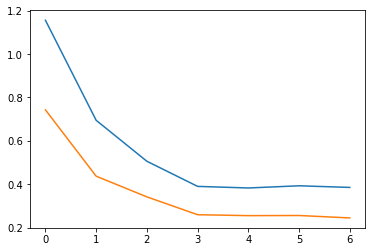

Epoch: [7]  [ 0/45]  eta: 0:00:50  lr: 0.000640  loss: 0.1905 (0.1905)  loss_classifier: 0.0592 (0.0592)  loss_box_reg: 0.1264 (0.1264)  loss_objectness: 0.0002 (0.0002)  loss_rpn_box_reg: 0.0047 (0.0047)  time: 1.1125  data: 0.7689  max mem: 4605
Epoch: [7]  [10/45]  eta: 0:00:14  lr: 0.000640  loss: 0.3381 (0.3833)  loss_classifier: 0.1128 (0.1129)  loss_box_reg: 0.2128 (0.2397)  loss_objectness: 0.0070 (0.0078)  loss_rpn_box_reg: 0.0147 (0.0228)  time: 0.4271  data: 0.0970  max mem: 4605
Epoch: [7]  [20/45]  eta: 0:00:09  lr: 0.000640  loss: 0.2730 (0.3449)  loss_classifier: 0.0906 (0.1017)  loss_box_reg: 0.1836 (0.2207)  loss_objectness: 0.0015 (0.0055)  loss_rpn_box_reg: 0.0086 (0.0171)  time: 0.3405  data: 0.0188  max mem: 4605
Epoch: [7]  [30/45]  eta: 0:00:05  lr: 0.000640  loss: 0.2865 (0.3462)  loss_classifier: 0.0856 (0.1047)  loss_box_reg: 0.1824 (0.2211)  loss_objectness: 0.0012 (0.0047)  loss_rpn_box_reg: 0.0075 (0.0157)  time: 0.3170  data: 0.0075  max mem: 4605
Epoch: [

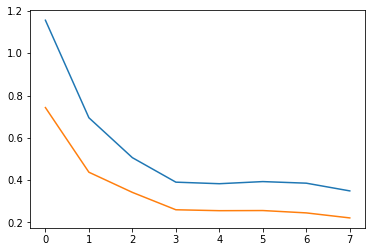

Epoch: [8]  [ 0/45]  eta: 0:00:46  lr: 0.000640  loss: 0.2986 (0.2986)  loss_classifier: 0.0991 (0.0991)  loss_box_reg: 0.1855 (0.1855)  loss_objectness: 0.0009 (0.0009)  loss_rpn_box_reg: 0.0131 (0.0131)  time: 1.0315  data: 0.6767  max mem: 4605
Epoch: [8]  [10/45]  eta: 0:00:13  lr: 0.000640  loss: 0.2986 (0.3364)  loss_classifier: 0.0816 (0.0996)  loss_box_reg: 0.1916 (0.2175)  loss_objectness: 0.0016 (0.0020)  loss_rpn_box_reg: 0.0129 (0.0173)  time: 0.3898  data: 0.0645  max mem: 4605
Epoch: [8]  [20/45]  eta: 0:00:09  lr: 0.000640  loss: 0.3128 (0.3251)  loss_classifier: 0.0816 (0.1002)  loss_box_reg: 0.1965 (0.2064)  loss_objectness: 0.0018 (0.0030)  loss_rpn_box_reg: 0.0093 (0.0155)  time: 0.3302  data: 0.0152  max mem: 4605
Epoch: [8]  [30/45]  eta: 0:00:05  lr: 0.000640  loss: 0.3345 (0.3330)  loss_classifier: 0.1123 (0.1018)  loss_box_reg: 0.2060 (0.2101)  loss_objectness: 0.0022 (0.0039)  loss_rpn_box_reg: 0.0102 (0.0171)  time: 0.3272  data: 0.0177  max mem: 4605
Epoch: [

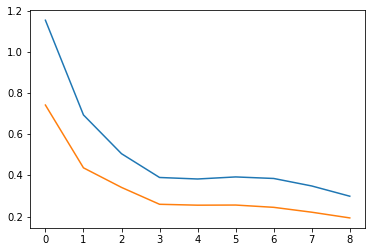

Epoch: [9]  [ 0/45]  eta: 0:00:46  lr: 0.000512  loss: 0.1501 (0.1501)  loss_classifier: 0.0491 (0.0491)  loss_box_reg: 0.0966 (0.0966)  loss_objectness: 0.0007 (0.0007)  loss_rpn_box_reg: 0.0037 (0.0037)  time: 1.0289  data: 0.6443  max mem: 4605
Epoch: [9]  [10/45]  eta: 0:00:13  lr: 0.000512  loss: 0.3053 (0.3025)  loss_classifier: 0.0883 (0.0936)  loss_box_reg: 0.1999 (0.1913)  loss_objectness: 0.0018 (0.0043)  loss_rpn_box_reg: 0.0095 (0.0134)  time: 0.3944  data: 0.0682  max mem: 4605
Epoch: [9]  [20/45]  eta: 0:00:08  lr: 0.000512  loss: 0.2745 (0.2905)  loss_classifier: 0.0750 (0.0910)  loss_box_reg: 0.1712 (0.1828)  loss_objectness: 0.0011 (0.0039)  loss_rpn_box_reg: 0.0094 (0.0128)  time: 0.3250  data: 0.0087  max mem: 4605
Epoch: [9]  [30/45]  eta: 0:00:05  lr: 0.000512  loss: 0.2745 (0.3070)  loss_classifier: 0.0750 (0.0953)  loss_box_reg: 0.1579 (0.1933)  loss_objectness: 0.0008 (0.0033)  loss_rpn_box_reg: 0.0055 (0.0151)  time: 0.3267  data: 0.0091  max mem: 4605
Epoch: [

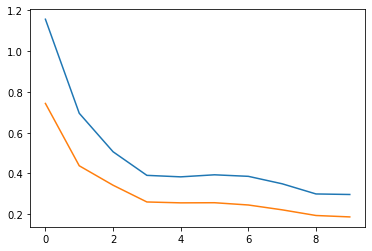

Epoch: [10]  [ 0/45]  eta: 0:00:33  lr: 0.000512  loss: 0.5078 (0.5078)  loss_classifier: 0.1326 (0.1326)  loss_box_reg: 0.3189 (0.3189)  loss_objectness: 0.0223 (0.0223)  loss_rpn_box_reg: 0.0340 (0.0340)  time: 0.7416  data: 0.4494  max mem: 4605
Epoch: [10]  [10/45]  eta: 0:00:12  lr: 0.000512  loss: 0.1981 (0.3030)  loss_classifier: 0.0789 (0.0954)  loss_box_reg: 0.1370 (0.1875)  loss_objectness: 0.0012 (0.0056)  loss_rpn_box_reg: 0.0042 (0.0145)  time: 0.3655  data: 0.0498  max mem: 4605
Epoch: [10]  [20/45]  eta: 0:00:08  lr: 0.000512  loss: 0.2357 (0.2904)  loss_classifier: 0.0789 (0.0908)  loss_box_reg: 0.1492 (0.1819)  loss_objectness: 0.0012 (0.0047)  loss_rpn_box_reg: 0.0050 (0.0130)  time: 0.3318  data: 0.0141  max mem: 4605
Epoch: [10]  [30/45]  eta: 0:00:05  lr: 0.000512  loss: 0.2863 (0.2874)  loss_classifier: 0.0826 (0.0913)  loss_box_reg: 0.1872 (0.1790)  loss_objectness: 0.0013 (0.0041)  loss_rpn_box_reg: 0.0079 (0.0130)  time: 0.3313  data: 0.0151  max mem: 4605
Epoc

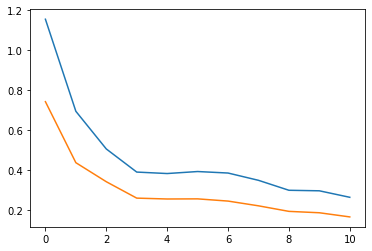

Epoch: [11]  [ 0/45]  eta: 0:00:27  lr: 0.000512  loss: 0.5353 (0.5353)  loss_classifier: 0.1754 (0.1754)  loss_box_reg: 0.3190 (0.3190)  loss_objectness: 0.0033 (0.0033)  loss_rpn_box_reg: 0.0375 (0.0375)  time: 0.6090  data: 0.2597  max mem: 4605
Epoch: [11]  [10/45]  eta: 0:00:12  lr: 0.000512  loss: 0.1896 (0.2409)  loss_classifier: 0.0693 (0.0800)  loss_box_reg: 0.1040 (0.1478)  loss_objectness: 0.0007 (0.0027)  loss_rpn_box_reg: 0.0050 (0.0104)  time: 0.3608  data: 0.0349  max mem: 4605
Epoch: [11]  [20/45]  eta: 0:00:08  lr: 0.000512  loss: 0.2329 (0.2791)  loss_classifier: 0.0693 (0.0851)  loss_box_reg: 0.1449 (0.1766)  loss_objectness: 0.0007 (0.0040)  loss_rpn_box_reg: 0.0078 (0.0134)  time: 0.3351  data: 0.0112  max mem: 4605
Epoch: [11]  [30/45]  eta: 0:00:05  lr: 0.000512  loss: 0.2513 (0.2742)  loss_classifier: 0.0763 (0.0834)  loss_box_reg: 0.1766 (0.1735)  loss_objectness: 0.0019 (0.0043)  loss_rpn_box_reg: 0.0081 (0.0130)  time: 0.3276  data: 0.0092  max mem: 4605
Epoc

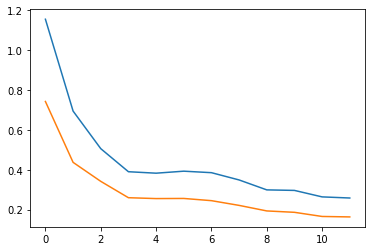

Epoch: [12]  [ 0/45]  eta: 0:00:32  lr: 0.000410  loss: 0.1189 (0.1189)  loss_classifier: 0.0461 (0.0461)  loss_box_reg: 0.0709 (0.0709)  loss_objectness: 0.0001 (0.0001)  loss_rpn_box_reg: 0.0018 (0.0018)  time: 0.7150  data: 0.3504  max mem: 4605
Epoch: [12]  [10/45]  eta: 0:00:14  lr: 0.000410  loss: 0.2863 (0.2582)  loss_classifier: 0.0945 (0.0886)  loss_box_reg: 0.1619 (0.1566)  loss_objectness: 0.0008 (0.0021)  loss_rpn_box_reg: 0.0074 (0.0110)  time: 0.4147  data: 0.0833  max mem: 4605
Epoch: [12]  [20/45]  eta: 0:00:09  lr: 0.000410  loss: 0.2542 (0.2502)  loss_classifier: 0.0820 (0.0836)  loss_box_reg: 0.1448 (0.1516)  loss_objectness: 0.0010 (0.0047)  loss_rpn_box_reg: 0.0074 (0.0103)  time: 0.3506  data: 0.0314  max mem: 4605
Epoch: [12]  [30/45]  eta: 0:00:05  lr: 0.000410  loss: 0.2253 (0.2518)  loss_classifier: 0.0739 (0.0831)  loss_box_reg: 0.1311 (0.1546)  loss_objectness: 0.0007 (0.0035)  loss_rpn_box_reg: 0.0072 (0.0107)  time: 0.3212  data: 0.0073  max mem: 4605
Epoc

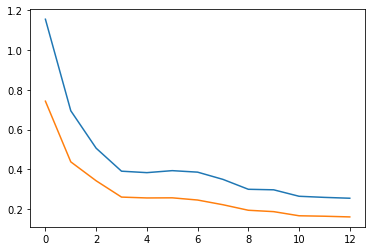

Epoch: [13]  [ 0/45]  eta: 0:01:35  lr: 0.000410  loss: 0.1558 (0.1558)  loss_classifier: 0.0501 (0.0501)  loss_box_reg: 0.0983 (0.0983)  loss_objectness: 0.0031 (0.0031)  loss_rpn_box_reg: 0.0042 (0.0042)  time: 2.1271  data: 1.6786  max mem: 4605
Epoch: [13]  [10/45]  eta: 0:00:16  lr: 0.000410  loss: 0.1495 (0.1981)  loss_classifier: 0.0526 (0.0645)  loss_box_reg: 0.0819 (0.1246)  loss_objectness: 0.0009 (0.0015)  loss_rpn_box_reg: 0.0032 (0.0075)  time: 0.4801  data: 0.1584  max mem: 4605
Epoch: [13]  [20/45]  eta: 0:00:10  lr: 0.000410  loss: 0.2416 (0.2453)  loss_classifier: 0.0797 (0.0777)  loss_box_reg: 0.1459 (0.1536)  loss_objectness: 0.0009 (0.0022)  loss_rpn_box_reg: 0.0081 (0.0119)  time: 0.3214  data: 0.0068  max mem: 4605
Epoch: [13]  [30/45]  eta: 0:00:05  lr: 0.000410  loss: 0.2416 (0.2454)  loss_classifier: 0.0829 (0.0766)  loss_box_reg: 0.1538 (0.1554)  loss_objectness: 0.0008 (0.0019)  loss_rpn_box_reg: 0.0076 (0.0116)  time: 0.3272  data: 0.0078  max mem: 4605
Epoc

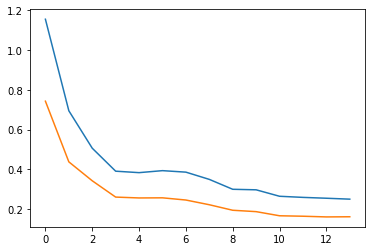

Epoch: [14]  [ 0/45]  eta: 0:00:33  lr: 0.000410  loss: 0.1231 (0.1231)  loss_classifier: 0.0643 (0.0643)  loss_box_reg: 0.0566 (0.0566)  loss_objectness: 0.0001 (0.0001)  loss_rpn_box_reg: 0.0021 (0.0021)  time: 0.7524  data: 0.3237  max mem: 4605
Epoch: [14]  [10/45]  eta: 0:00:12  lr: 0.000410  loss: 0.2206 (0.2345)  loss_classifier: 0.0822 (0.0763)  loss_box_reg: 0.1188 (0.1464)  loss_objectness: 0.0009 (0.0012)  loss_rpn_box_reg: 0.0049 (0.0106)  time: 0.3562  data: 0.0349  max mem: 4605
Epoch: [14]  [20/45]  eta: 0:00:08  lr: 0.000410  loss: 0.2320 (0.2436)  loss_classifier: 0.0822 (0.0802)  loss_box_reg: 0.1525 (0.1500)  loss_objectness: 0.0007 (0.0013)  loss_rpn_box_reg: 0.0079 (0.0121)  time: 0.3223  data: 0.0075  max mem: 4605
Epoch: [14]  [30/45]  eta: 0:00:05  lr: 0.000410  loss: 0.2071 (0.2310)  loss_classifier: 0.0634 (0.0772)  loss_box_reg: 0.1184 (0.1412)  loss_objectness: 0.0005 (0.0011)  loss_rpn_box_reg: 0.0079 (0.0114)  time: 0.3244  data: 0.0065  max mem: 4605
Epoc

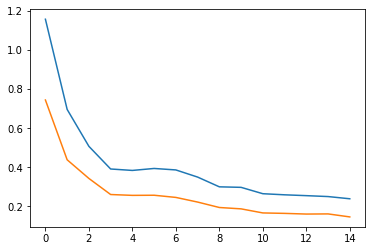

Epoch: [15]  [ 0/45]  eta: 0:00:43  lr: 0.000328  loss: 0.3521 (0.3521)  loss_classifier: 0.1068 (0.1068)  loss_box_reg: 0.2131 (0.2131)  loss_objectness: 0.0010 (0.0010)  loss_rpn_box_reg: 0.0312 (0.0312)  time: 0.9587  data: 0.5807  max mem: 4605


In [ ]:
from engine import train_one_epoch, evaluate

# let's train it for 10 epochs
num_epochs = 40

loss_log = []
box_reg = []
ap_log = []

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    m = train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    loss_log.append(m.loss.avg)
    box_reg.append(m.loss_box_reg.avg)

    

    lr_scheduler.step()
    # evaluate on the test dataset (skip this part)
    c_e = evaluate(model, data_loader_test, device=device)

    plt.plot(loss_log)
    plt.plot(box_reg)
    plt.show()




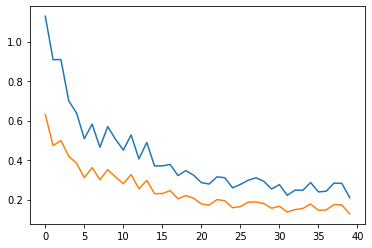

In [ ]:
plt.plot(loss_log)
plt.plot(box_reg)
plt.show()

## Displaying Predictions

In [ ]:
def display_pred(img,prediction,ground_truth = None,threshold = 0.0):
  img2 = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
  plt.figure()
  fig, ax = plt.subplots(1, figsize=(12,9))
  ax.imshow(img2)
  boxes = prediction[0]['boxes'].cpu().numpy()
  labels = prediction[0]['labels'].cpu().numpy()
  scores = prediction[0]['scores'].cpu().numpy()
  
  if ground_truth is not None:
    gt_boxes = ground_truth['boxes'].cpu().numpy()
    gt_labels = ground_truth['labels'].cpu().numpy()
    for i in range (gt_boxes.shape[0]):
      x1 = gt_boxes[i,0]
      y1 = gt_boxes[i,1]
      box_w = gt_boxes[i,2] - x1
      box_h = gt_boxes[i,3] - y1

      color = colors[10]
      bbox = patches.Rectangle((x1, y1), box_w, box_h,
                linewidth=2, edgecolor=color, facecolor='none')
      ax.add_patch(bbox)
      #plt.text(x1, y1, s="Ground Truth", 
      #              color='white', verticalalignment='top',
      #              bbox={'color': color, 'pad': 0})

  for i in range(boxes.shape[0]):
    if scores[i] > threshold:
      #print(i,boxes[i,:],labels[i],scores[i])
      x1 = boxes[i,0]
      y1 = boxes[i,1]
      box_w = boxes[i,2] - x1
      box_h = boxes[i,3] - y1
      color = colors[0]
      bbox = patches.Rectangle((x1, y1), box_w, box_h,
                linewidth=2, edgecolor=color, facecolor='none')
      ax.add_patch(bbox)
      #plt.text(x1, y1, s=dataset.classes[labels[i]], 
      #              color='white', verticalalignment='top',
      #              bbox={'color': color, 'pad': 0})
  plt.axis('off')
  plt.show()

# pick random image
#indices = torch.randperm(len(val_set)).tolist()
#datasets = torch.utils.data.Subset(val_set, indices)
#img, ground_true = datasets[0]


#print(len(dataset))
# put the model in evaluation mode
#model.eval()
#with torch.no_grad():
#    print(img.shape)
#    prediction = model([img.to(device)])
    # print(prediction)
#evaluate(model, data_loader_val, device=device)
#display_pred(img,prediction,ground_true,threshold=0.9)
#display_img(img,ground_true)

# Visuel Custom Benchmark 

In [ ]:
from torchvision.transforms import ToTensor

# Download benchmarch images 
bench_folder = 'bench'

download_file_from_google_drive('1rjnVGzfFOWq2cHVE2kmz9vw0rxEMexwg','valset.zip')
!unzip -q "valset.zip"


replace __MACOSX/._LECT_HEAD? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


torch.Size([3, 1692, 2820])


<Figure size 432x288 with 0 Axes>

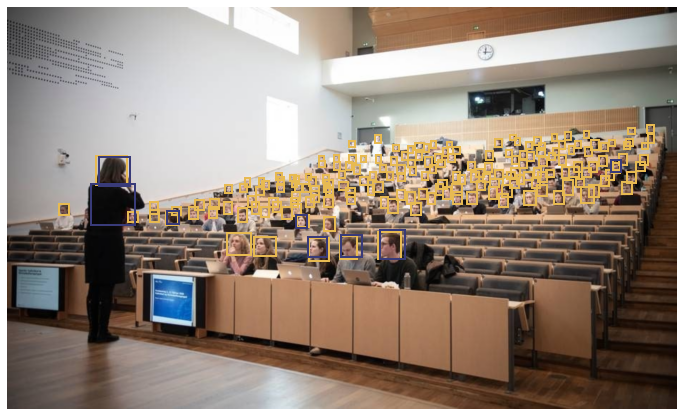

torch.Size([3, 801, 1335])


<Figure size 432x288 with 0 Axes>

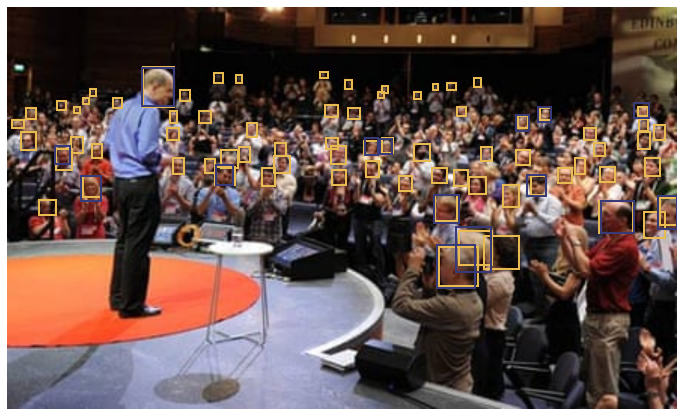

torch.Size([3, 573, 1020])


<Figure size 432x288 with 0 Axes>

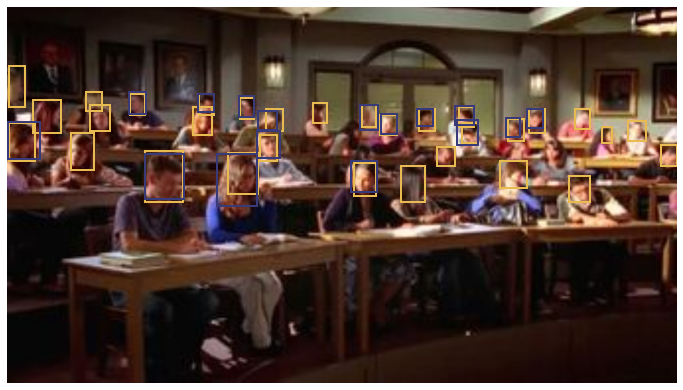

torch.Size([3, 3465, 4800])


<Figure size 432x288 with 0 Axes>

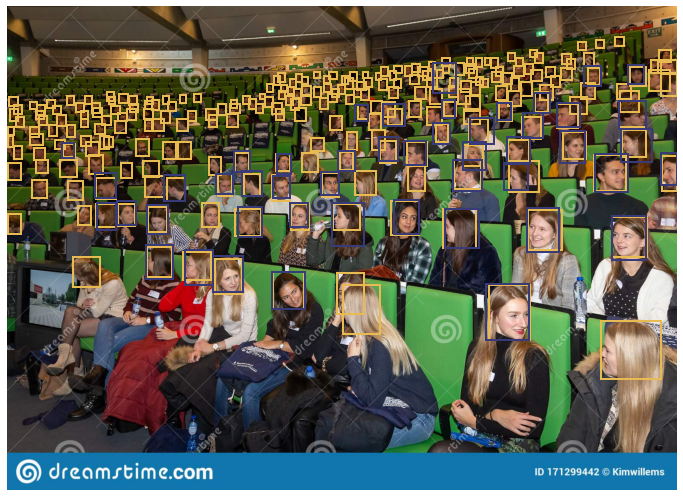

torch.Size([3, 3084, 5400])


<Figure size 432x288 with 0 Axes>

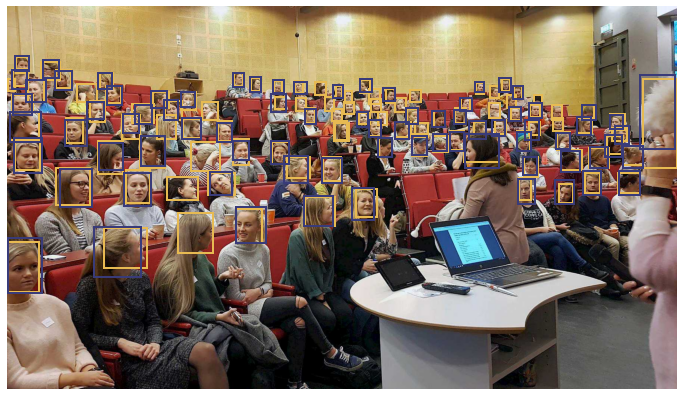

torch.Size([3, 3600, 6144])


<Figure size 432x288 with 0 Axes>

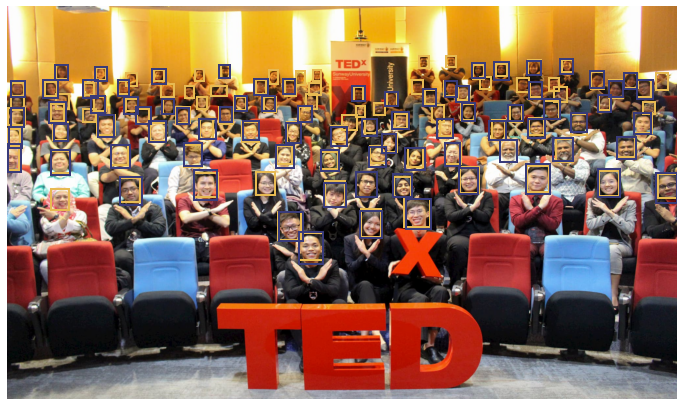

torch.Size([3, 1350, 3660])


<Figure size 432x288 with 0 Axes>

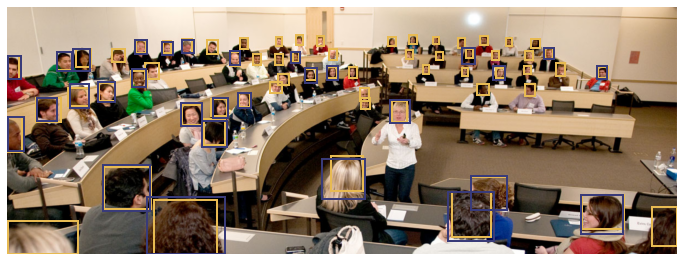

torch.Size([3, 4077, 7092])


<Figure size 432x288 with 0 Axes>

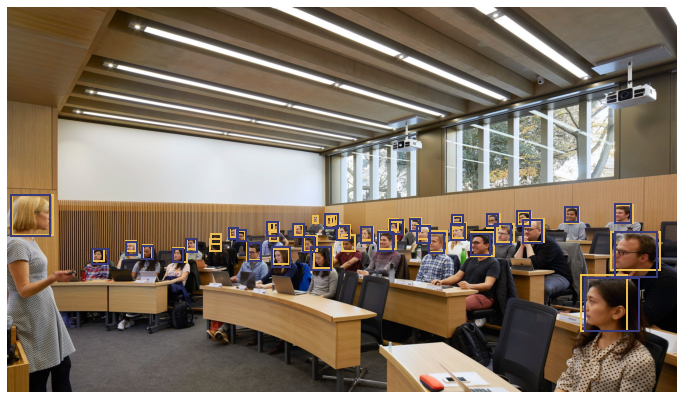

torch.Size([3, 1101, 1920])


<Figure size 432x288 with 0 Axes>

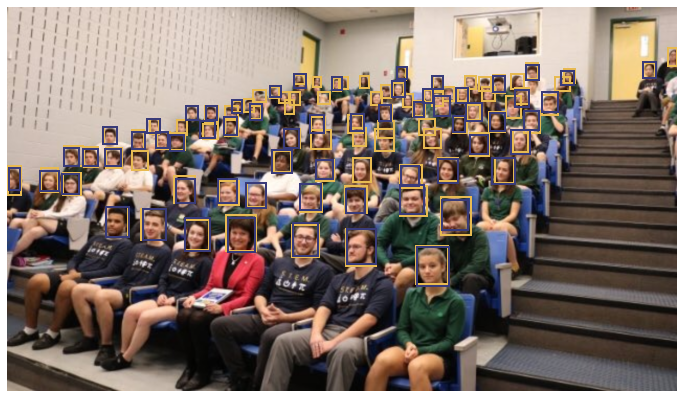

torch.Size([3, 1425, 3000])


<Figure size 432x288 with 0 Axes>

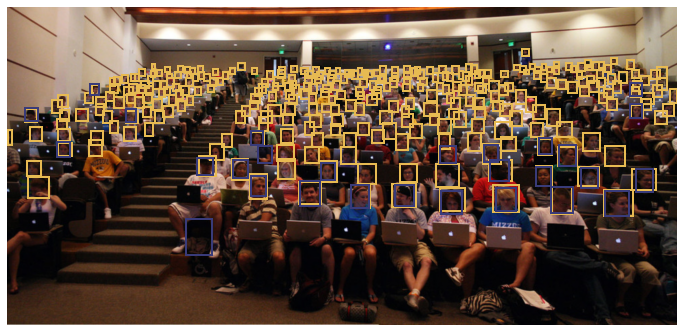

torch.Size([3, 6888, 12648])


<Figure size 432x288 with 0 Axes>

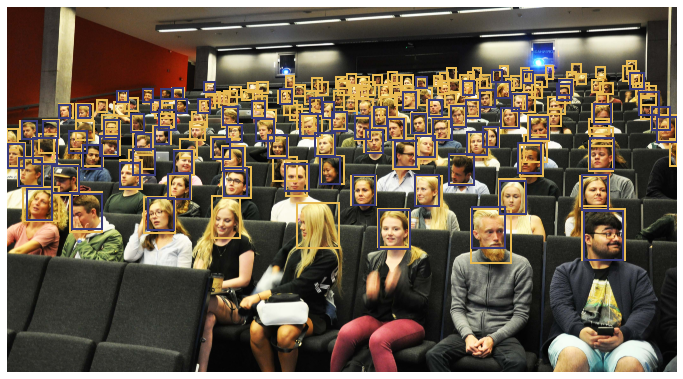

torch.Size([3, 1050, 1950])


<Figure size 432x288 with 0 Axes>

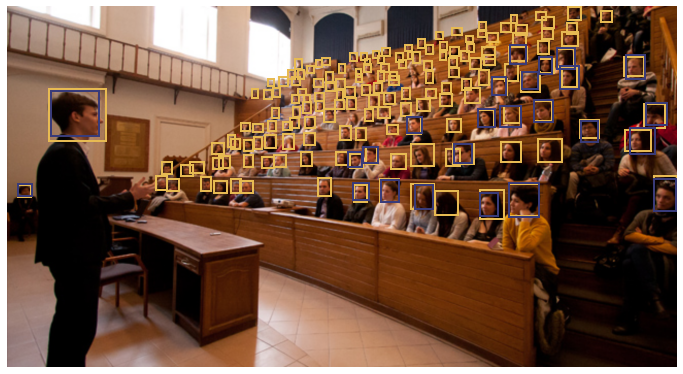

torch.Size([3, 1800, 2700])


<Figure size 432x288 with 0 Axes>

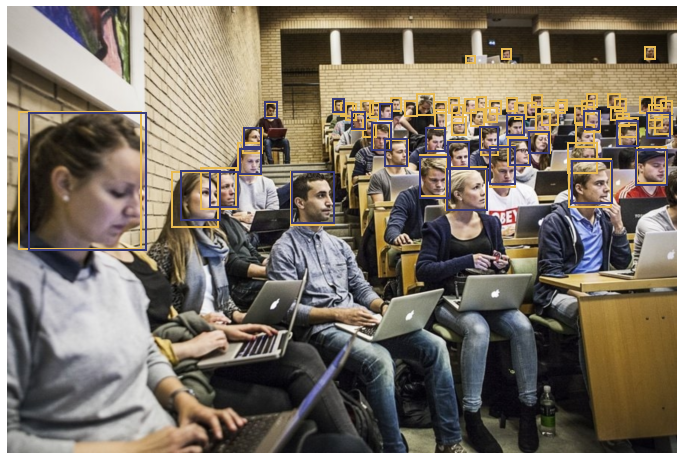

torch.Size([3, 1422, 2133])


<Figure size 432x288 with 0 Axes>

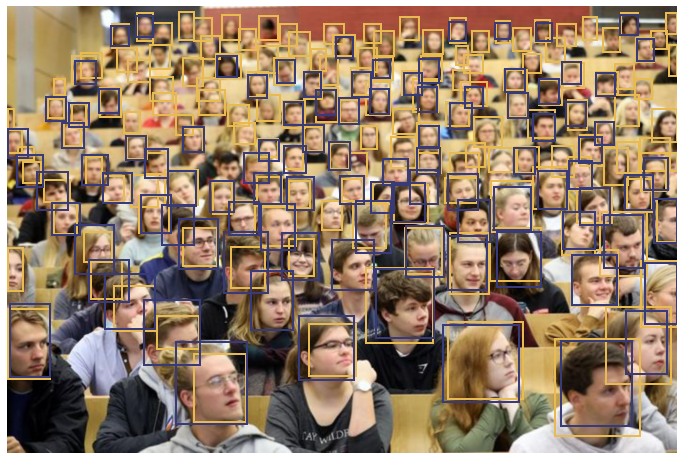

torch.Size([3, 2499, 3750])


<Figure size 432x288 with 0 Axes>

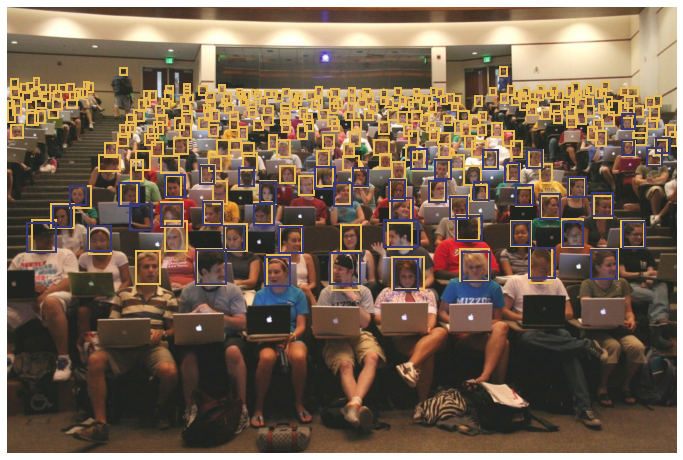

torch.Size([3, 1800, 2700])


<Figure size 432x288 with 0 Axes>

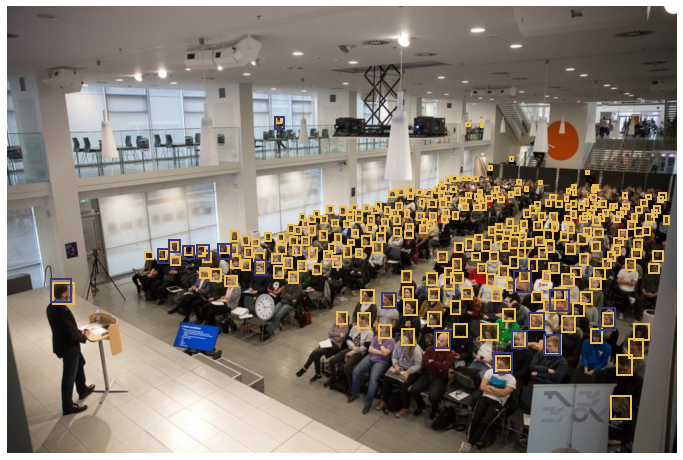

torch.Size([3, 2559, 3840])


<Figure size 432x288 with 0 Axes>

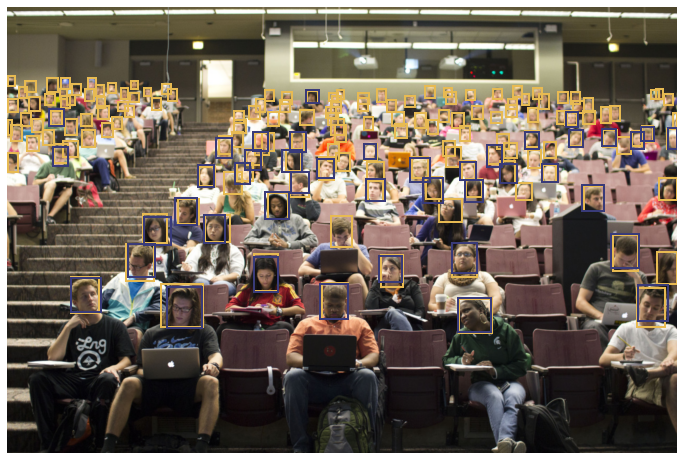

torch.Size([3, 735, 1110])


<Figure size 432x288 with 0 Axes>

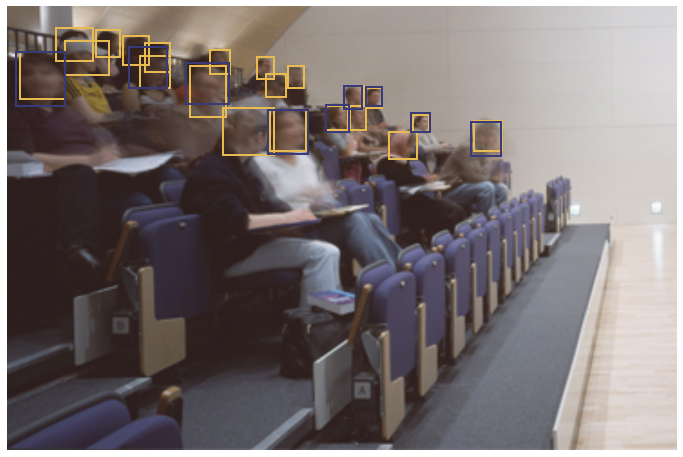

torch.Size([3, 2868, 3900])


<Figure size 432x288 with 0 Axes>

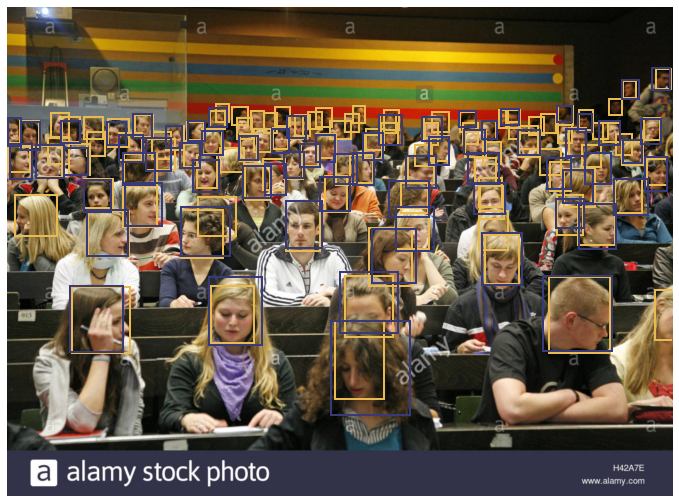

torch.Size([3, 720, 1536])


<Figure size 432x288 with 0 Axes>

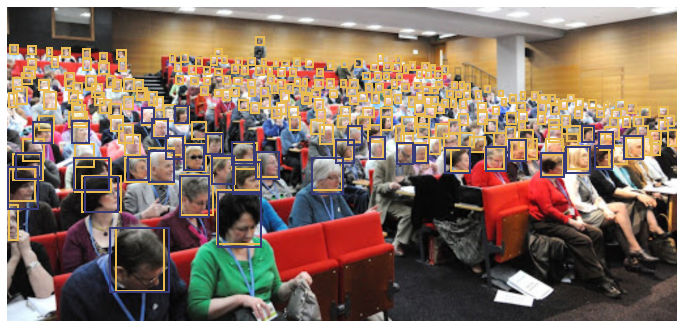

torch.Size([3, 1386, 1920])


<Figure size 432x288 with 0 Axes>

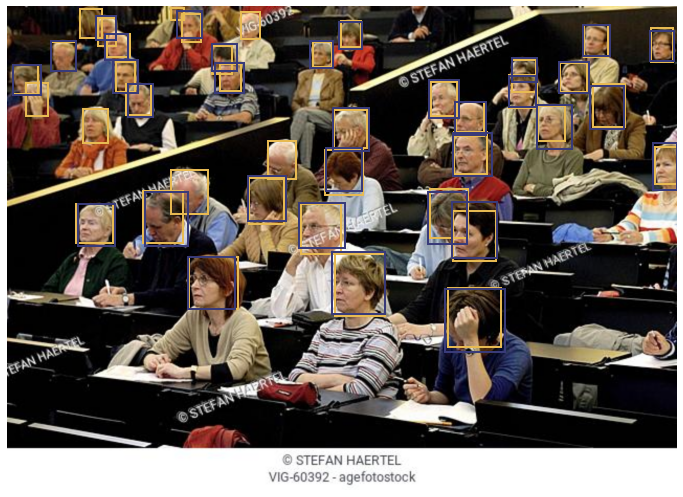

In [ ]:
# pick random image
lect_dataset = TrainDatasetArgumented('LECT_HEAD',transforms=T.ToTensor(),eval=True)


for i in range(21):
  img, ground_true = lect_dataset[i]

  print(img.shape)
  model.eval()
  with torch.no_grad():
    pred = model([img.to(device)])

  display_pred(img,pred,ground_true,threshold=0.9)

## Evaluation on Lect Dataset

In [ ]:
# put the model in evaluation mode
data_loader_val = torch.utils.data.DataLoader(
    lect_dataset, batch_size=1, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

model.eval()
evaluate(model, data_loader_val, device=device)

creating index...
index created!
Test:  [ 0/21]  eta: 0:00:57  model_time: 0.2137 (0.2137)  evaluator_time: 1.6940 (1.6940)  time: 2.7373  data: 0.7940  max mem: 4605
Test:  [20/21]  eta: 0:00:00  model_time: 0.1242 (0.1363)  evaluator_time: 0.3839 (0.5149)  time: 0.6569  data: 0.0205  max mem: 4605
Test: Total time: 0:00:16 (0.7667 s / it)
Averaged stats: model_time: 0.1242 (0.1363)  evaluator_time: 0.3839 (0.5149)
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.188
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.420
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.127
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.035
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.166
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.378
 Average Recall     (AR) @[ IoU=

## Custom image 

In [ ]:
from torchvision.transforms import ToTensor

# Download benchmarch images 


imgPath = 'testimg.jpg'
custom_img = Image.open(imgPath).convert("RGB")
custom_img = T.ToTensor()(custom_img,None)
custom_img = custom_img[0]

model.eval()
with torch.no_grad():
  pred = model([custom_img.to(device)])

display_pred(custom_img,pred,threshold=0.9)
